## Face_detection_with_Yoloface

### reference : https://github.com/elyha7/yoloface

In [32]:
from yoloface.face_detector import YoloDetector
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import glob
import os
from itertools import combinations
%matplotlib inline

-1
/Users/jungsuplim/Desktop/2022_HAI/2022HAISecondSemester/Cross-cutting-with-face/yoloface/weights/yolov5n_state_dict.pt
[[[558, 202, 661, 331], [0, 376, 36, 483]]] [[[[584, 248], [628, 250], [604, 272], [587, 297], [621, 298]], [[1, 426], [5, 429], [0, 446], [0, 459], [1, 461]]]]


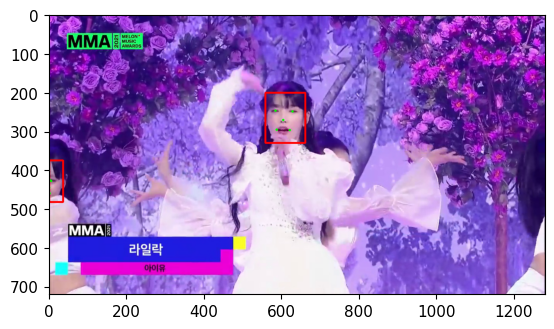

In [44]:
# gpu=0 -> gpu / gpu=-1 -> cpu
detector = YoloDetector(target_size=720, gpu=-1, min_face=90)
img = np.array(Image.open('test_image.jpg'))
bboxes, points = detector.predict(img)
print(bboxes, points)

#draw box
for box, lm in zip(bboxes[0], points[0]):
    x1, y1, x2, y2 = box[0], box[1], box[2], box[3]
    img = cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 3)
    for i in lm:
        x = i[0]
        y = i[1]
        img = cv2.circle(img, (x, y), 3, (0, 255, 0), -1)
plt.imshow(img)

In [45]:
df_detection = pd.DataFrame(columns=['frame_num', 'video_num', 'detect_person_num', 'boxes', 'key_point'])
frames = glob.glob('./dataset/frame/*')

for frame in frames :
    for image in glob.glob(frame + '/*.jpg'):
        # 영상 번호
        video_num = image.split('/')[4][:-4] #[:-4] -> .jpg remove
        # frame 
        frame_num = frame.split('/')[-1]
        image = np.array(Image.open(image))
        boxes, points = detector.predict(image)
        # 사람 명 수 확인
        detect_person_num = len(boxes[0])
        # 1명 이상
        if detect_person_num > 0 :
            data = {
                'frame_num' : int(frame_num),
                'video_num' : int(video_num),
                'detect_person_num': detect_person_num,
                'boxes': boxes[0],
                'key_point' : points[0]
            }
            print(f'{frame_num}번 째 frame : {video_num} 영상 이미지 저장')
            df_detection = df_detection.append(data, ignore_index=True)
# frame 기준 sorting
df_detection = df_detection.sort_values(by='frame_num')
print(df_detection)
df_detection.to_parquet('./dataset/detection_data/yoloface_data.parquet')

95번 째 frame : 1 영상 이미지 저장
59번 째 frame : 3 영상 이미지 저장
92번 째 frame : 2 영상 이미지 저장
92번 째 frame : 1 영상 이미지 저장
66번 째 frame : 1 영상 이미지 저장
50번 째 frame : 2 영상 이미지 저장
68번 째 frame : 2 영상 이미지 저장
68번 째 frame : 3 영상 이미지 저장
68번 째 frame : 1 영상 이미지 저장
57번 째 frame : 2 영상 이미지 저장
57번 째 frame : 1 영상 이미지 저장
32번 째 frame : 2 영상 이미지 저장
69번 째 frame : 2 영상 이미지 저장
69번 째 frame : 1 영상 이미지 저장
51번 째 frame : 2 영상 이미지 저장
58번 째 frame : 1 영상 이미지 저장
67번 째 frame : 2 영상 이미지 저장
67번 째 frame : 3 영상 이미지 저장
67번 째 frame : 1 영상 이미지 저장
93번 째 frame : 2 영상 이미지 저장
94번 째 frame : 2 영상 이미지 저장
94번 째 frame : 3 영상 이미지 저장
94번 째 frame : 1 영상 이미지 저장
60번 째 frame : 2 영상 이미지 저장
60번 째 frame : 3 영상 이미지 저장
34번 째 frame : 3 영상 이미지 저장
34번 째 frame : 1 영상 이미지 저장
33번 째 frame : 1 영상 이미지 저장
20번 째 frame : 3 영상 이미지 저장
20번 째 frame : 1 영상 이미지 저장
18번 째 frame : 2 영상 이미지 저장
18번 째 frame : 3 영상 이미지 저장
27번 째 frame : 2 영상 이미지 저장
27번 째 frame : 1 영상 이미지 저장
9번 째 frame : 1 영상 이미지 저장
11번 째 frame : 2 영상 이미지 저장
11번 째 frame : 3 영상 이미지 저장
11번 째 frame : 1 영상 이미지 저장
7번 째 frame : 

ImportError: Unable to find a usable engine; tried using: 'pyarrow', 'fastparquet'.
A suitable version of pyarrow or fastparquet is required for parquet support.
Trying to import the above resulted in these errors:
 - Missing optional dependency 'pyarrow'. pyarrow is required for parquet support. Use pip or conda to install pyarrow.
 - Missing optional dependency 'fastparquet'. fastparquet is required for parquet support. Use pip or conda to install fastparquet.

In [6]:
df_detection = pd.read_parquet('./dataset/detection_data/yoloface_data.parquet')

In [7]:
df_detection.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 176 entries, 60 to 97
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   frame_num          176 non-null    int64 
 1   video_num          176 non-null    int64 
 2   detect_person_num  176 non-null    int64 
 3   boxes              176 non-null    object
 4   key_point          176 non-null    object
dtypes: int64(3), object(2)
memory usage: 8.2+ KB


In [8]:
df_detection.head()

,frame_num,video_num,detect_person_num,boxes,key_point
index,,,,,
60,1,2,1,"[[978, 247, 1053, 345]]","[[[998, 283], [1033, 280], [1018, 300], [1009,..."
167,2,1,1,"[[440, 98, 752, 486]]","[[[591, 252], [697, 249], [693, 318], [626, 39..."
166,2,3,1,"[[529, 132, 726, 407]]","[[[622, 249], [690, 231], [695, 287], [654, 34..."
165,2,2,2,"[[608, 223, 687, 330], [331, 314, 424, 419]]","[[[643, 271], [670, 262], [672, 284], [657, 30..."
149,3,1,1,"[[472, 113, 790, 522]]","[[[615, 275], [735, 271], [709, 358], [629, 41..."


In [9]:
print('frame 수: '+str(df_detection['frame_num'].nunique()))
print('사람이 1명 이상이면서 적어도 2개 이상인 frame수 : ' +str(df_detection['frame_num'].value_counts() > 1))

frame 수: 88
사람이 1명 이상이면서 적어도 2개 이상인 frame수 : 37     True
86     True
30     True
36     True
41     True
      ...  
51    False
58    False
59    False
62    False
50    False
Name: frame_num, Length: 88, dtype: bool


### filter

In [10]:
frame_index = df_detection['frame_num'].value_counts()[df_detection['frame_num'].value_counts()>1].index
frame_index

Int64Index([ 37,  86,  30,  36,  41,  44,  45,  88,   2,  54,  94,  63,  64,
             67,  68,  71,  72,  77,  26,  78,  98,  99,  16,  11,  22,   7,
             97,  21,   3,   5,  69,  81,   8,  76,  10,  83,  60,  57,  55,
             53,  52,  49, 100,  87,  38,  25,  27,  28,  29,  20,  92,  91,
             34,  19,  89,  18,  17,  46,  15],
           dtype='int64')

In [11]:
df = df_detection.set_index('frame_num')
df_filtered = pd.DataFrame(columns=['frame_num', 'video_num', 'detect_person_num', 'boxes', 'key_point']).set_index('frame_num')

for frame_num in frame_index:
    df1 = df.loc[frame_num]
    mask = df1.loc[frame_num].duplicated(['detect_person_num'], keep=False)
    df_filtered = pd.concat([df_filtered,df1.loc[mask]])
df_filtered

,video_num,detect_person_num,boxes,key_point
frame_num,,,,
37,2,1,"[[550, 214, 662, 406]]","[[[576, 290], [579, 283], [560, 323], [591, 35..."
37,1,1,"[[588, 114, 725, 330]]","[[[614, 196], [634, 189], [593, 230], [621, 27..."
36,3,2,"[[1003, 430, 1126, 584], [691, 187, 843, 394]]","[[[1024, 493], [1055, 492], [1015, 514], [1018..."
36,1,2,"[[614, 158, 769, 351], [42, 270, 201, 466]]","[[[660, 232], [727, 225], [701, 264], [679, 30..."
44,1,3,"[[153, 326, 268, 464], [1065, 365, 1193, 506],...","[[[174, 395], [213, 376], [192, 410], [197, 43..."
44,2,3,"[[557, 123, 658, 240], [1149, 163, 1266, 304],...","[[[579, 186], [610, 168], [598, 204], [604, 21..."
88,1,2,"[[946, 232, 1097, 407], [603, 211, 743, 384]]","[[[1002, 299], [1062, 311], [1023, 340], [986,..."
88,2,2,"[[525, 116, 674, 302], [896, 131, 1055, 313]]","[[[575, 179], [635, 204], [592, 220], [556, 23..."
2,1,1,"[[440, 98, 752, 486]]","[[[591, 252], [697, 249], [693, 318], [626, 39..."


In [12]:
df_filtered.index.unique()

Int64Index([37, 36, 44, 88,  2, 54, 63, 64, 67, 68, 71, 72, 78, 98, 99, 22,  7,
            97, 21,  3, 81, 76, 83, 27, 29],
           dtype='int64', name='frame_num')

In [13]:
def cal_area_sum(boxes: list):
    area_list = []
    for box in boxes:
        x1, y1, x2, y2 = box[0][0], box[0][1], box[0][2], box[0][3]
        area = (x2-x1)*(y2-y1)
        area_list.append(area)
    return area_list

### area 기반 Similarity

In [14]:
similarity_list = []
for frame in df_filtered.index.unique():
    df_temp = df_filtered.loc[frame]
    # 사람 수가 같은 이미지 수
    n = len(df_temp)
    # 감지된 사람 수
    detect_person_num = df_temp['detect_person_num'].iloc[0]
    # 영상 번호 리스트
    video_num_list = list(df_temp['video_num'])
    # 선택된 영상
    selected_video = None
    area_min = 100000000
    
    for selected_video_nums in list(combinations(video_num_list, 2)):
        videonum1, videonum2 = selected_video_nums[0], selected_video_nums[1]
        boxes = list(df_temp.loc[(df_temp['video_num']==videonum1) | (df_temp['video_num']==videonum2)]['boxes'])
        key_points =list(df_temp.loc[(df_temp['video_num']==videonum1) | (df_temp['video_num']==videonum2)]['key_point'])
        area1, area2 = cal_area_sum(boxes)
        if (area1/area2) > 0.8 or (area1/area2) < 1.2 :
            if area_min == 100000000 : 
                area_min = abs(area1/area2 - 1)
                selected_video = selected_video_nums
            elif area_min < abs(area1/area2 - 1) : 
                continue
            else: 
                area_min = abs(area1/area2 - 1)
                selected_video = selected_video_nums
    similarity_list.append((frame, selected_video, area_min))
similarity_list = sorted(similarity_list, key = lambda x: x[2])
print(similarity_list)

[(76, (3, 2), 0.014280856851411117), (67, (3, 1), 0.04099770642201839), (88, (1, 2), 0.04651078877101822), (81, (2, 1), 0.09819991954947704), (72, (1, 2), 0.187143834055163), (97, (2, 1), 0.20408163265306123), (37, (2, 1), 0.27331711273317116), (63, (1, 2), 0.2846590909090909), (44, (1, 2), 0.3429804518913431), (36, (3, 1), 0.3668059501922113), (64, (1, 2), 0.3812680993750952), (99, (1, 2), 0.4465753424657535), (98, (3, 2), 0.47063492063492063), (3, (1, 3), 0.5592159683510161), (7, (1, 3), 0.6057774001699234), (78, (2, 1), 0.6139167862266858), (83, (2, 3), 0.6560341324664771), (29, (2, 3), 0.7191700759789597), (54, (3, 2), 0.9089759797724399), (22, (2, 3), 1.0364839319470698), (68, (3, 1), 1.0892857142857144), (2, (1, 3), 1.2345362251961238), (27, (1, 2), 3.2156096330853616), (21, (3, 2), 3.245475248711495), (71, (2, 3), 3.485407066052227)]


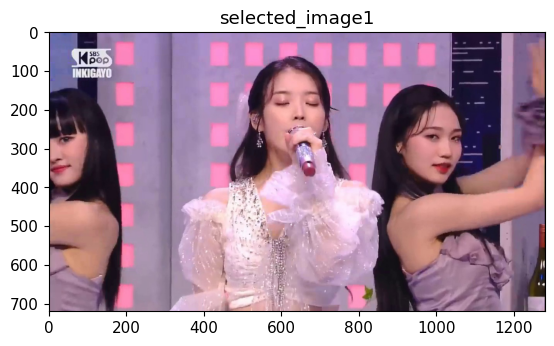

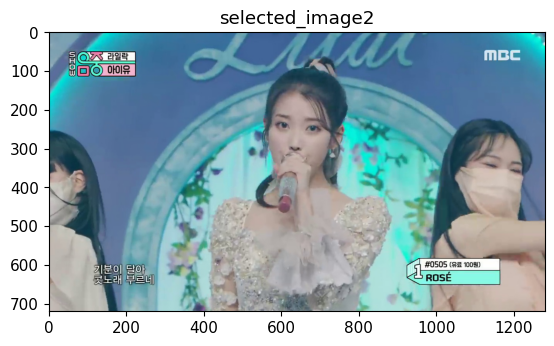

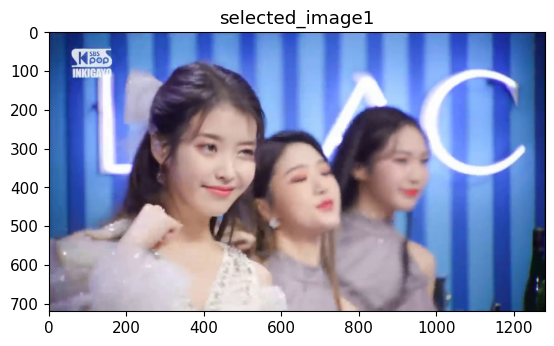

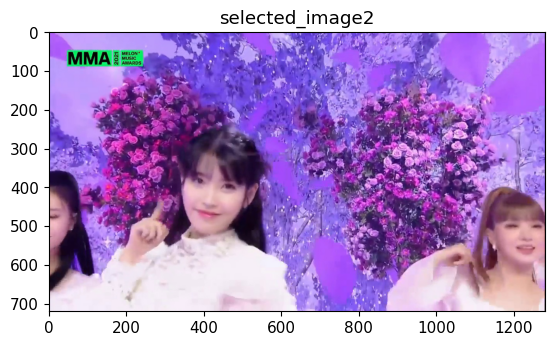

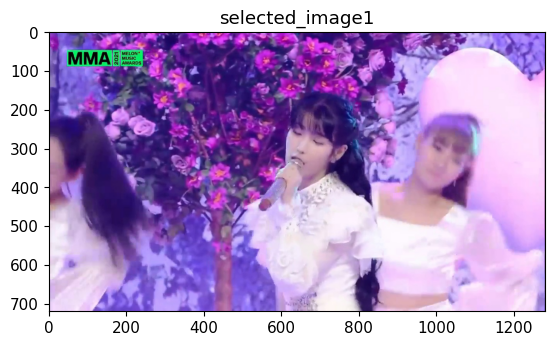

...

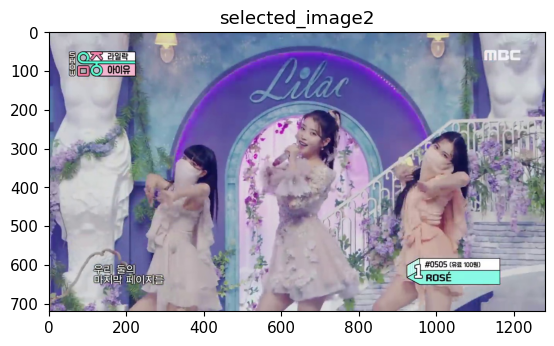

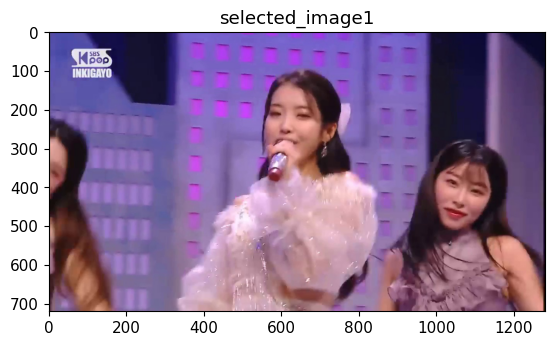

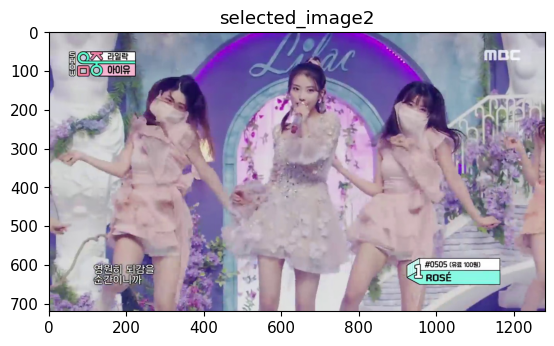

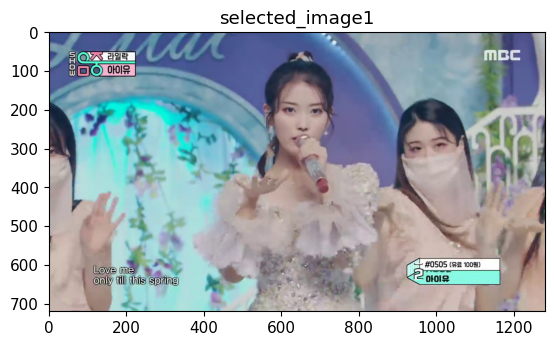

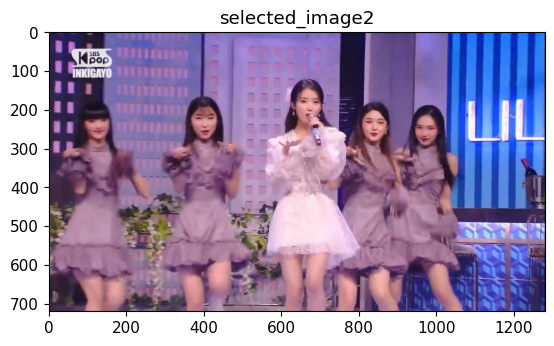

In [15]:
n = 0
for frame, selected_video, _ in similarity_list:
#     if n > 10 : break
    selected_video_num1 = selected_video[0]
    selected_video_num2 = selected_video[1]
    plt.title('selected_image1')
    plt.imshow(Image.open(f'./dataset/frame/{frame}/{selected_video_num1}.jpg'))
    plt.show()
    plt.title('selected_image2')
    plt.imshow(Image.open(f'./dataset/frame/{frame}/{selected_video_num2}.jpg'))
    plt.show()

### Euclidean Distance 기반

In [16]:
def findEuclideanDistance(source_representation, test_representation):
    if type(source_representation) == list:
        source_representation = np.array(source_representation)

    if type(test_representation) == list:
        test_representation = np.array(test_representation)

    euclidean_distance = source_representation - test_representation
    euclidean_distance = np.sum(np.multiply(euclidean_distance, euclidean_distance))
    euclidean_distance = np.sqrt(euclidean_distance)
    return euclidean_distance

In [28]:
similarity_list = []
for frame in df_filtered.index.unique():
    df_temp = df_filtered.loc[frame]
    # 사람 수가 같은 이미지 수
    n = len(df_temp)
    # 감지된 사람 수
    detect_person_num = df_temp['detect_person_num'].iloc[0]
    # 영상 번호 리스트
    video_num_list = list(df_temp['video_num'])
    # 선택된 영상
    selected_video = None
    dis_min = 100000000
    
    for selected_video_nums in list(combinations(video_num_list, 2)):
        videonum1, videonum2 = selected_video_nums[0], selected_video_nums[1]
        key_points =list(df_temp.loc[(df_temp['video_num']==videonum1) | (df_temp['video_num']==videonum2)]['key_point'])
        dis = findEuclideanDistance(key_points[0], key_points[1])
        print(dis)
        if dis < dis_min:
            dis_min = dis
            selected_video = selected_video_nums
    similarity_list.append((frame, selected_video, dis_min))
similarity_list = sorted(similarity_list, key = lambda x: x[2])
print(similarity_list)

217.95412361320444
1673.2531189273188
1218.0562384389318
1242.1646428714673
89.12911982062877
546.4622585320966
23.130067012440755
262.40998456613653
971.9830245431244
1175.7151015445877
1997.3259623807025
1668.0554547136614
1316.3927985217786
1667.2333369987537
2572.9617175543053
1687.2009364625187
215.10927455598002
1668.853498663079
2396.346594297244
785.2171674129394
1427.621448423916
1148.4602735837232
2770.264969276405
94.83142938920619
1815.7144599303053
3444.5048991110466
161.67560112769027
837.5989493785197
3205.0288610244993
[(37, (2, 1), 100000000), (36, (3, 1), 100000000), (44, (1, 2), 100000000), (88, (1, 2), 100000000), (2, (1, 3), 100000000), (54, (3, 2), 100000000), (63, (1, 2), 100000000), (64, (1, 2), 100000000), (67, (2, 3), 100000000), (68, (3, 1), 100000000), (71, (2, 3), 100000000), (72, (1, 2), 100000000), (78, (2, 1), 100000000), (98, (3, 2), 100000000), (99, (1, 2), 100000000), (22, (2, 3), 100000000), (7, (1, 3), 100000000), (97, (2, 3), 100000000), (21, (3, 2